## Thoughts
### 1. Length of a thread (Number of consecutive replies) might tell us whether the sentiment is positive or negative
### 2. The hashtags would be quite essential in getting to see the important problem areas
### 3. We can apply clustering on our cleaned tweets to find problem clusters (due to lack of time, didn't explore much)
### 4. Wordclouds can be good in visualizing the important keywords.
### 5. I applied multiple cleaning techniques but due to lack of time didn't post it here (they are in bottom unused section)
### 6. Sentiment analysis deep learning model used to find the sentiments of the sentences and then focussed on only negative sentences. A quick read tells that the sentiments are more or less correct.
### 7. A graph and tree is created for problem areas of a given company (using hashtags graphs/trees).
### 8. Langdetect was used to filter out other languages except English (but it is too slow. Didn't use in here).

## Furthermore...
1. Upon reading the results of deep learning sentiment analysis model, I found that it had an accuracy of around 89%. I, then considered only the negative sentiments (value < 0.5) as the sentences which we want to focus on.
2. This analysis can also be extended to positive sentences as well to find good areas.
3. The above two sets can be further compared to give more insights.
4. The accuracy of model is therefore more than 85% and I have also provided a tree based visualization to show the key problem areas.
5. The key problem areas are also visible in the heat map which give more insightful information.

In [2]:
import numpy as np
import pandas as pd
import itertools
from langdetect import detect
import re
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from emoticon_list import *
import seaborn as sns
import matplotlib.pyplot as plt
import json
from nltk.tokenize import RegexpTokenizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
import operator
import random

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\64378\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
df = pd.read_csv("twcs.csv")

In [5]:
inbounds_and_outbounds = pd.read_csv("inbounds_and_outbounds.csv")

In [4]:
df.head()

,tweet_id,author_id,inbound,created_at,text,response_tweet_id,in_response_to_tweet_id
0,1,sprintcare,False,Tue Oct 31 22:10:47 +0000 2017,@115712 I understand. I would like to assist y...,2,3.0
1,2,115712,True,Tue Oct 31 22:11:45 +0000 2017,@sprintcare and how do you propose we do that,NaN,1.0
2,3,115712,True,Tue Oct 31 22:08:27 +0000 2017,@sprintcare I have sent several private messag...,1,4.0
3,4,sprintcare,False,Tue Oct 31 21:54:49 +0000 2017,@115712 Please send us a Private Message so th...,3,5.0
4,5,115712,True,Tue Oct 31 21:49:35 +0000 2017,@sprintcare I did.,4,6.0


In [5]:
first_inbound = df[pd.isnull(df.in_response_to_tweet_id) & df.inbound]

In [6]:
inbounds_and_outbounds = pd.merge(first_inbound, df, left_on='tweet_id', 
                                  right_on='in_response_to_tweet_id')
print("Found {} responses.".format(len(inbounds_and_outbounds)))

Found 875292 responses.


In [7]:
inbounds_and_outbounds.head()

,tweet_id_x,author_id_x,inbound_x,created_at_x,text_x,response_tweet_id_x,in_response_to_tweet_id_x,tweet_id_y,author_id_y,inbound_y,created_at_y,text_y,response_tweet_id_y,in_response_to_tweet_id_y
0,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,6,sprintcare,False,Tue Oct 31 21:46:24 +0000 2017,@115712 Can you please send us a private messa...,"5,7",8.0
1,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,9,sprintcare,False,Tue Oct 31 21:46:14 +0000 2017,@115712 I would love the chance to review the ...,NaN,8.0
2,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,10,sprintcare,False,Tue Oct 31 21:45:59 +0000 2017,@115712 Hello! We never like our customers to ...,NaN,8.0
3,18,115713,True,Tue Oct 31 19:56:01 +0000 2017,@115714 y’all lie about your “great” connectio...,17,NaN,17,sprintcare,False,Tue Oct 31 19:59:13 +0000 2017,@115713 H there! We'd definitely like to work ...,16,18.0
4,20,115715,True,Tue Oct 31 22:03:34 +0000 2017,"@115714 whenever I contact customer support, t...",19,NaN,19,sprintcare,False,Tue Oct 31 22:10:10 +0000 2017,@115715 Please send me a private message so th...,NaN,20.0


In [8]:
inbounds_and_outbounds = inbounds_and_outbounds[inbounds_and_outbounds.inbound_y ^ True]

In [7]:
len(inbounds_and_outbounds)

794299

In [8]:
inbounds_and_outbounds.head()

,tweet_id_x,author_id_x,inbound_x,created_at_x,text_x,response_tweet_id_x,in_response_to_tweet_id_x,tweet_id_y,author_id_y,inbound_y,created_at_y,text_y,response_tweet_id_y,in_response_to_tweet_id_y,text_original,text_company,sentiment
0,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,6,sprintcare,False,Tue Oct 31 21:46:24 +0000 2017,@115712 Can you please send us a private messa...,"5,7",8.0,specialusername worst customer service,specialusername can please send u private mess...,0.2
1,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,9,sprintcare,False,Tue Oct 31 21:46:14 +0000 2017,@115712 I would love the chance to review the ...,NaN,8.0,specialusername worst customer service,specialusername i would love chance review acc...,0.2
2,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,10,sprintcare,False,Tue Oct 31 21:45:59 +0000 2017,@115712 Hello! We never like our customers to ...,NaN,8.0,specialusername worst customer service,specialusername hello we never like customer f...,0.2
3,18,115713,True,Tue Oct 31 19:56:01 +0000 2017,@115714 y’all lie about your “great” connectio...,17,NaN,17,sprintcare,False,Tue Oct 31 19:59:13 +0000 2017,@115713 H there! We'd definitely like to work ...,16,18.0,specialusername y’all lie “great” connection 5...,specialusername h wed definitely like work lon...,0.6
4,20,115715,True,Tue Oct 31 22:03:34 +0000 2017,"@115714 whenever I contact customer support, t...",19,NaN,19,sprintcare,False,Tue Oct 31 22:10:10 +0000 2017,@115715 Please send me a private message so th...,NaN,20.0,specialusername whenever i contact customer su...,specialusername please send private message i ...,0.5


In [11]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [12]:
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_x'].apply(lambda x: re.sub("@[\w]+", "specialusername", x))
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: re.sub("[\.:-]?http[\w:\/\.?]{2,}", "urllink", x))
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: re.sub("\/{2,}[\w:\/\.?]{2,}", "urllink", x))
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: re.sub("urllink[\w]+", "urllink", x))
punc_list = '!"$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: x.translate(str.maketrans('', '', punc_list+'/')))
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer() 
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: ' '.join([lemmatizer.lemmatize(i) if i not in stop_words else '' for i in x.split(" ") ]))
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: ' '.join([lemmatizer.lemmatize(i) if i not in stop_words else '' for i in x.split(" ") ]))
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: x.replace("\n", " ").replace("\t", " "))
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: ' '.join([i if i!=' ' else '' for i in x.split(" ")]))

In [13]:
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_y'].apply(lambda x: re.sub("@[\w]+", "specialusername", x))
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: re.sub("[\.:-]?http[\w:\/\.?]{2,}", "urllink", x))
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: re.sub("\/{2,}[\w:\/\.?]{2,}", "urllink", x))
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: re.sub("urllink[\w]+", "urllink", x))
punc_list = '!"$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: x.translate(str.maketrans('', '', punc_list+'/')))
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer() 
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: ' '.join([lemmatizer.lemmatize(i) if i not in stop_words else '' for i in x.split(" ") ]))
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: ' '.join([lemmatizer.lemmatize(i) if i not in stop_words else '' for i in x.split(" ") ]))
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: x.replace("\n", " ").replace("\t", " "))
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: ' '.join([i if i!=' ' else '' for i in x.split(" ")]))

In [14]:
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: x.lower())
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: x.lower())

In [15]:
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(lambda x: re.sub(' +', ' ', x))
inbounds_and_outbounds['text_company'] = inbounds_and_outbounds['text_company'].apply(lambda x: re.sub(' +', ' ', x))

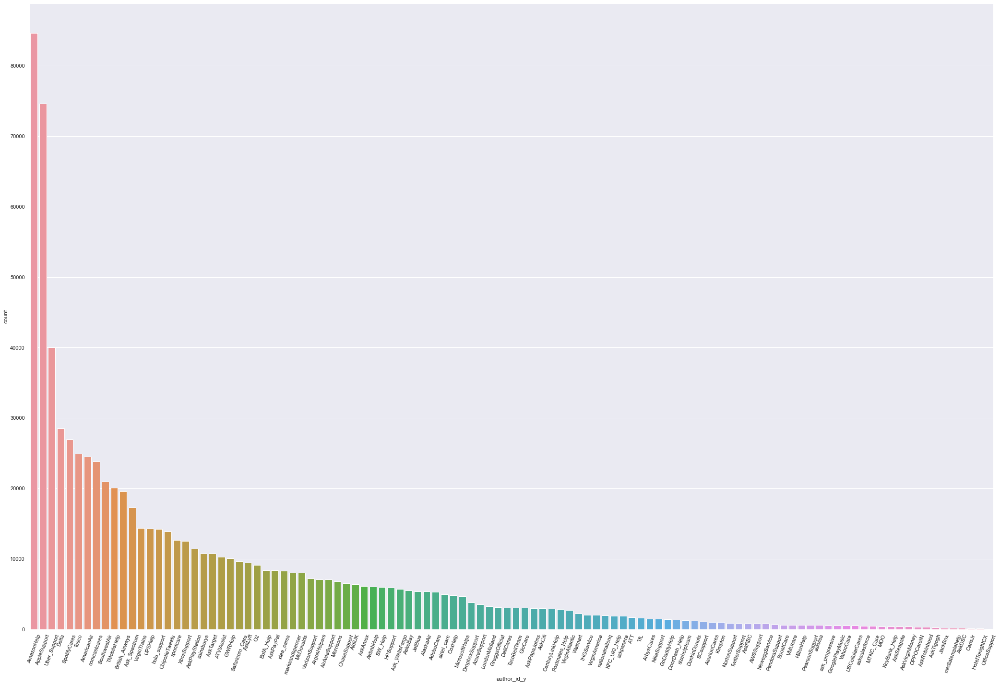

In [31]:
sns.set(rc={'figure.figsize':(36,24)})
sns.countplot(x='author_id_y', data=inbounds_and_outbounds, order = inbounds_and_outbounds['author_id_y'].value_counts().index)
plt.xticks(rotation=70)
plt.show()

### We can focus on top tweeted companies

In [9]:
import os
import numpy as np
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers.embeddings import Embedding
from keras.layers import Bidirectional
from keras.preprocessing import sequence
from keras.layers import Dropout
from keras.models import model_from_json
from keras.models import load_model

Using TensorFlow backend.
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py

In [10]:
weight_path = 'deepsentiment-master/model/best_model.hdf5'
loaded_model = load_model(weight_path)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



C:\ProgramData\Anaconda3\lib\site-packages\keras\engine\saving.py:384: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [11]:
loaded_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 56, 100)           40000100  
_________________________________________________________________
bidirectional_1 (Bidirection (None, 256)               234496    
_________________________________________________________________
dense_1 (Dense)              (None, 512)               131584    
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                5130      
Total params: 40,371,310
Trainable params: 371,210
Non-trainable params: 40,000,100
_________________________________________________________________


In [12]:
def live_test(trained_model, all_data, word_idx):
    live_list = []
    live_list_np = np.zeros((56,1))
    # split the sentence into its words and remove any punctuations.
    tokenizer = RegexpTokenizer(r'\w+')
    for data in all_data:
        data_sample_list = tokenizer.tokenize(data)
        labels = np.array(['1','2','3','4','5','6','7','8','9','10'], dtype = "int")
        # get index for the live stage
        data_index = np.array([word_idx[word.lower()] if word.lower() in word_idx else 0 for word in data_sample_list])
        data_index_np = np.array(data_index)
        # padded with zeros of length 56 i.e maximum length
        padded_array = np.zeros(56)
        padded_array[:min(56, data_index_np.shape[0])] = data_index_np[:min(56, data_index_np.shape[0])]
        data_index_np_pad = padded_array.astype(int)
        live_list.append(data_index_np_pad)
    live_list_np = np.asarray(live_list)
#     print(live_list_np.shape)
    # get score from the model
    score = trained_model.predict(live_list_np, batch_size=len(data), verbose=0)
#     print(score.shape)
    single_score = np.round(np.argmax(score, axis=1)/10, decimals=2) # maximum of the array i.e single band
#     print(single_score.shape)
#     print(single_score)
    # weighted score of top 3 bands
#     top_3_index = np.argsort(score, axis=1)[0][-3:]
#     top_3_index = list(map(lambda x: x[-3:], np.argsort(score, axis=1).tolist()))
#     top_3_scores = score[0][top_3_index]
#     top_3_weights = top_3_scores/np.sum(top_3_scores)
#     single_score_dot = np.round(np.dot(top_3_index, top_3_weights)/10, decimals = 2)
    return single_score

In [24]:
data_sample = ["This blog is really yes yes yes.", 'i am boring']
word_idx = json.load(open("deepsentiment-master/Data/word_idx.txt"))
result = live_test(loaded_model,data_sample, word_idx)

In [25]:
result

array([0.5, 0.3])

In [26]:
data_sample = inbounds_and_outbounds.text_original

In [27]:
result = live_test(loaded_model,data_sample, word_idx)

In [6]:
result = np.load("sentiments.npy")

In [7]:
inbounds_and_outbounds['sentiment'] = result

In [71]:
inbounds_and_outbounds.columns

Index(['tweet_id_x', 'author_id_x', 'inbound_x', 'created_at_x', 'text_x',
       'response_tweet_id_x', 'in_response_to_tweet_id_x', 'tweet_id_y',
       'author_id_y', 'inbound_y', 'created_at_y', 'text_y',
       'response_tweet_id_y', 'in_response_to_tweet_id_y', 'text_original',
       'text_company', 'sentiment'],
      dtype='object')

In [8]:
inbounds_and_outbounds

,tweet_id_x,author_id_x,inbound_x,created_at_x,text_x,response_tweet_id_x,in_response_to_tweet_id_x,tweet_id_y,author_id_y,inbound_y,created_at_y,text_y,response_tweet_id_y,in_response_to_tweet_id_y,text_original,text_company,sentiment
0,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,6,sprintcare,False,Tue Oct 31 21:46:24 +0000 2017,@115712 Can you please send us a private messa...,"5,7",8.0,specialusername worst customer service,specialusername can please send u private mess...,0.2
1,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,9,sprintcare,False,Tue Oct 31 21:46:14 +0000 2017,@115712 I would love the chance to review the ...,NaN,8.0,specialusername worst customer service,specialusername i would love chance review acc...,0.2
2,8,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,10,sprintcare,False,Tue Oct 31 21:45:59 +0000 2017,@115712 Hello! We never like our customers to ...,NaN,8.0,specialusername worst customer service,specialusername hello we never like customer f...,0.2
3,18,115713,True,Tue Oct 31 19:56:01 +0000 2017,@115714 y’all lie about your “great” connectio...,17,NaN,17,sprintcare,False,Tue Oct 31 19:59:13 +0000 2017,@115713 H there! We'd definitely like to work ...,16,18.0,specialusername y’all lie “great” connection 5...,specialusername h wed definitely like work lon...,0.6
4,20,115715,True,Tue Oct 31 22:03:34 +0000 2017,"@115714 whenever I contact customer support, t...",19,NaN,19,sprintcare,False,Tue Oct 31 22:10:10 +0000 2017,@115715 Please send me a private message so th...,NaN,20.0,specialusername whenever i contact customer su...,specialusername please send private message i ...,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794294,2987942,823867,True,Wed Nov 22 07:30:39 +0000 2017,Hai @AirAsiaSupport #asking how many days need...,2987941,NaN,2987941,AirAsiaSupport,False,Wed Nov 22 07:55:05 +0000 2017,@823867 we have replied you via DM.Thanks-Emir,NaN,2987942.0,hai specialusername #asking many day needed pr...,specialusername replied via dmthanksemir,0.7
794295,2987944,823868,True,Wed Nov 22 07:43:36 +0000 2017,@AirAsiaSupport \n\nI am unable to do web chec...,2987943,NaN,2987943,AirAsiaSupport,False,Wed Nov 22 07:54:57 +0000 2017,"@823868 Sorry but kindly try to clear browser,...",NaN,2987944.0,specialusername i unable web checkin i getting...,specialusername sorry kindly try clear browser...,0.0
794296,2987946,524544,True,Wed Nov 22 08:25:48 +0000 2017,@VirginTrains Hope you are well? Does the 9.30...,2987945,NaN,2987945,VirginTrains,False,Wed Nov 22 08:27:34 +0000 2017,@524544 That's a Peak service. The 09:56 is th...,NaN,2987946.0,specialusername hope well does 930am train cre...,specialusername thats peak service the 0956 fi...,0.7
794297,2987948,823869,True,Wed Nov 22 08:35:16 +0000 2017,@115714 wtf!? I’ve been having really shitty s...,2987947,NaN,2987947,sprintcare,False,Wed Nov 22 08:43:51 +0000 2017,"@823869 Hey, we'd be happy to look into this f...",NaN,2987948.0,specialusername wtf i’ve really shitty service...,specialusername hey wed happy look please send...,0.3


In [14]:
inbounds_and_outbounds['author_id_y'].value_counts()

AmazonHelp         84637
AppleSupport       74632
Uber_Support       40029
Delta              28485
SpotifyCares       26940
                   ...  
mediatemplehelp      190
AskDSC               189
CarlsJr              138
HotelTonightCX       131
OfficeSupport         58
Name: author_id_y, Length: 108, dtype: int64

In [9]:
filtered = inbounds_and_outbounds[(inbounds_and_outbounds['sentiment']<0.5) & (inbounds_and_outbounds['author_id_y']=='AmazonHelp')]

In [29]:
np.save("sentiments.npy", result)

In [56]:
def create_graph(s):
    table = {}
    nodes = {}
    for sent in s:
        hashes = [w for w in sent.split(" ") if w.startswith("#")]
        for i in range(len(hashes)):
            for j in range(i+1, len(hashes)):
                if hashes[i] in nodes:
                    nodes[hashes[i]]+=1
                else:
                    nodes[hashes[i]]=1
                if hashes[j] in nodes:
                    nodes[hashes[j]]+=1
                else:
                    nodes[hashes[j]]=1
                if (hashes[i],hashes[j]) in table:
                    table[(hashes[i],hashes[j])]+=1
                elif (hashes[j],hashes[i]) in table:
                    table[(hashes[j],hashes[i])]+=1
                else:
                    table[(hashes[i],hashes[j])]=1
    sorted_d = dict(sorted(table.items(), key=operator.itemgetter(1), reverse=True))
    return sorted_d, nodes

In [57]:
table, nodes=create_graph(filtered.text_original.tolist())

In [59]:
len(nodes)

2270

In [111]:
def get_word_cloud_dict(s):
    d = {}
    count = 0
    for i in s:
        a = ''
        for j in i.split(" "):
            if j == '':
                continue
            count+=1
            if j in d:
                d[j] = (d[j]*(count-1) + 1)/float(count)
            else:
                d[j] = 1/float(count)
    return d

d = get_word_cloud_dict(filtered.text_original)

In [112]:
d

{'way': 1.0,
 'drop': 0.5007552346289208,
 'ball': 0.33367560131477525,
 'customer': 0.2903237274799596,
 'service': 0.24719312812974736,
 'specialusername': 0.6959261447102512,
 'pissed': 0.14446416707451196,
 'right': 0.12869174765402733,
 'package': 0.18593585737093882,
 '‘accidentally’': 0.09090909090909091,
 'opened': 0.08458415491042537,
 '4': 0.08694770219989176,
 'item': 0.1297577498746544,
 'missing': 0.07088665865133233,
 'worth': 0.06401504410409624,
 '£97': 0.058823529411764705,
 'you': 0.09230619919005813,
 'need': 0.06946557933975121,
 'better': 0.0525540087419908,
 'delivery': 0.15844048098930044,
 'driver': 0.05874294911142939,
 'urllink': 0.19695803257289501,
 'order': 0.14218883601237559,
 'local': 0.03945763025711417,
 'courier': 0.046395508650282066,
 'last': 0.05572074362074206,
 '6': 0.046229607592413784,
 'day': 0.12480889569550119,
 'still': 0.07236184020652495,
 'hasn’t': 0.033569785528576014,
 'delivered': 0.09668006498064088,
 'over': 0.029058583130763226,
 '

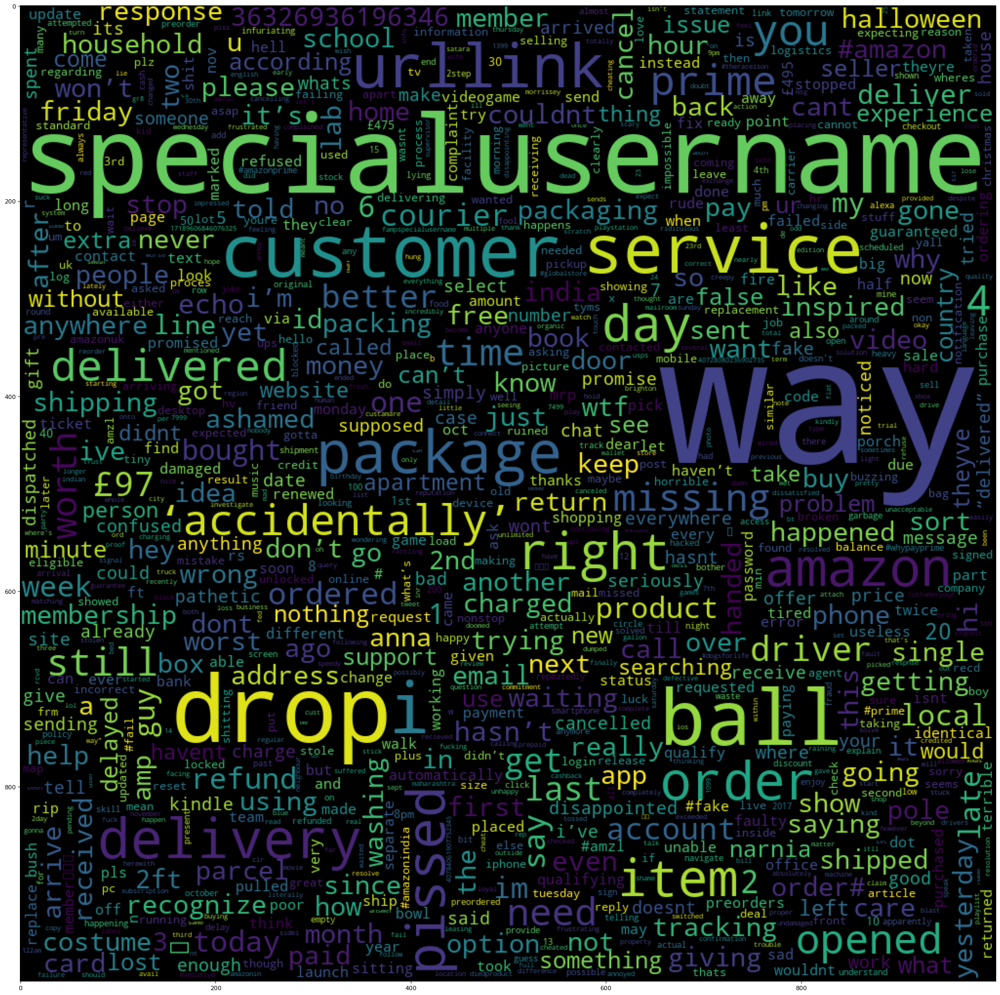

In [14]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(40, 30), dpi=80, facecolor='w', edgecolor='k')
from wordcloud import WordCloud, STOPWORDS 
wc = WordCloud(width=1000,height=1000, max_words=1000,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(d)
plt.imshow(wc)

In [23]:
filtered.text_original.tolist()

['way drop ball customer service specialusername pissed right ',
 'specialusername package ‘accidentally’ opened 4 item missing worth £97 you need better delivery driver urllink',
 'specialusername specialusername order local courier last 6 day still hasn’t delivered over 1 week late 😡',
 'bought specialusername echo show won’t recognize single specialusername account household wtf guy',
 'specialusername item delivered tracking say handed hour ago 2nd time happened sort urllink',
 'in response specialusername packing video packaging 2ft washing line pole specialusername urllink',
 'anna inspired idea lab school specialusername package shipped narnia amazon go anywhere according anna urllink',
 'im never using amazon after waiting day item delivery theyve gone sent wrong country',
 'my package specialusername halloween costume “delivered” friday i don’t i searching everywhere last minute idea',
 'specialusername specialusername specialusername specialusername order# 36326936196346 you 

In [70]:
vectorizer = TfidfVectorizer(max_features=10000)
X = vectorizer.fit_transform(filtered.text_original)

In [71]:
X.shape

(42868, 10000)

In [ ]:
ks = range(1, 30)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(a)
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

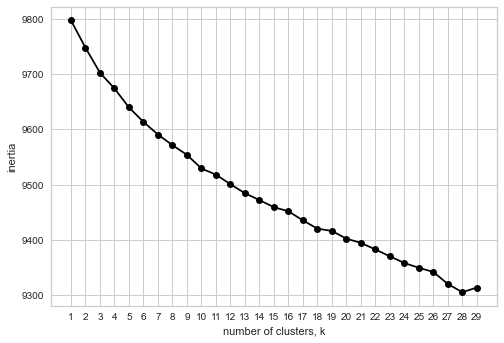

In [72]:
# We can see that clusters should be around 28.

In [26]:
t = X[:1000, :]

In [73]:
kmeans = KMeans(n_clusters=28, random_state=0).fit(X)

In [74]:
kmeans.labels_

array([16, 23, 21, ..., 27, 16, 27])

In [75]:
pca = TruncatedSVD(n_components=2)
pca.fit(X)

TruncatedSVD()

In [76]:
a = pca.fit_transform(X)

In [77]:
a.shape

(42868, 2)

In [78]:
a[:,1]

array([-0.14631138,  0.03909848,  0.07436603, ..., -0.00148377,
       -0.13029773, -0.02047372])

In [79]:
df=pd.DataFrame()
df['x'] = a[:,0]
df['y'] = a[:,1]

In [80]:
df['sentence'] = inbounds_and_outbounds['text_original']

In [81]:
df['cluster'] = kmeans.labels_

In [82]:
b = df

In [84]:
df['cluster'] = kmeans.labels_

In [90]:
b = df.head(1000)

In [91]:
# I expected that we might get clusters based on the semantics but this doesn't looks like it.
import plotly.express as px
fig = px.scatter(b, x="x", y="y", color="cluster", hover_data=['sentence'])
fig.show()

In [ ]:
# There are very few positives overall

In [43]:
import plotly.graph_objects as go
import networkx as nx

In [44]:
len(nodes)

2270

In [45]:
G = nx.DiGraph()
count = 0
for i in nodes:
    G.add_node(i)

In [100]:
edges_list = []
edge_df = pd.DataFrame()
for i in table:
    if i[0] in G.nodes and i[1] in G.nodes:
        if table[i]>5:
            edges_list.append((i[0], i[1], table[i]))
            edge_df = edge_df.append(pd.DataFrame([[i[0], i[1], table[i]]], columns=['node1', 'node2', 'count']))

In [101]:
edge_df = edge_df.head(20).pivot("node1", "node2", "count")

In [102]:
edge_df

node2,#,#amazon,#amazongreatindianfestival,#amazonindia,#customerservice,#fail,#fraud,#prime,#specialusername
node1,,,,,,,,,
#,104.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.0
#amazon,37.0,16.0,NaN,NaN,20.0,29.0,11.0,41.0,NaN
#amazonindia,15.0,67.0,21.0,NaN,NaN,NaN,NaN,NaN,NaN
#amazonprime,NaN,41.0,NaN,15.0,NaN,12.0,NaN,NaN,NaN
#amazonuk,NaN,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
#fail,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN
#pathetic,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
#prime,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN
#specialusername,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN,25.0


## This is another way to represent the tree

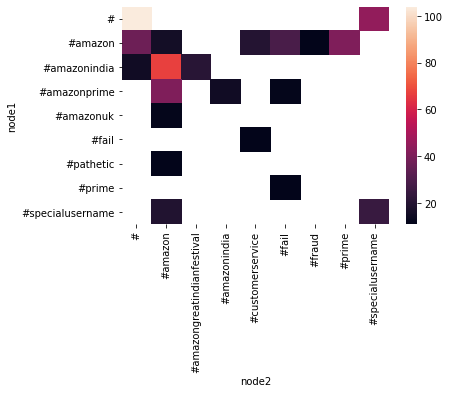

In [103]:
sns.heatmap(edge_df)

In [47]:
G.add_weighted_edges_from(edges_list)

In [48]:
pos = {}
for i in nodes:
    pos[i] = (random.uniform(0,1), random.uniform(0,1))

In [49]:
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)


In [50]:
edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

In [51]:
node_x = []
node_y = []
for node in G.nodes:
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

In [52]:
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='YlGnBu',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

In [53]:
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(f'{adjacencies[0]}: # of connections: '+str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

In [26]:
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='<br>Network graph made with Python',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Python code: <a href='https://plotly.com/ipython-notebooks/network-graphs/'> https://plotly.com/ipython-notebooks/network-graphs/</a>",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

In [30]:
nodes

['#hateshopping',
 '#designer',
 '#dickgames',
 '#timetobrushup',
 '#amazonlostfaith',
 '#urindianconsumer',
 '#efficientthan',
 '#iwanttolearn',
 '#ceoamitagarwal',
 '#issue',
 '#gtsport',
 '#bamboo',
 '#serveinmylanguage',
 '#criminal',
 '#savemycommute',
 '#fifau17wc',
 '#comeonnow',
 '#peak',
 '#customerfail',
 '#stop',
 '#smokingsucks',
 '#joke',
 '#bummer',
 '#whyisthishappening',
 '#amazonbuyus',
 '#dissatisfied',
 '#deepavali',
 '#unacceptable',
 '#ironman',
 '#october13th',
 '#approach',
 '#shameamazonein',
 '#cloudtail',
 '#discourteous',
 '#amazoneffect',
 '#whydoihavetoreplaceit',
 '#amazongiftcard',
 '#supplychainproblem',
 '#online',
 '#mywifebirthday',
 '#konstsmide',
 '#14yearcustomer',
 '#nofashionsense',
 '#daylightrobbery',
 '#itscalledparcelpaper',
 '#bookaddict',
 '#just',
 '#customers',
 '#twitter',
 '#atoz👈',
 '#shouldhavewenttothemall',
 '#resolution',
 '#howto',
 '#gimmebrow',
 '#scam',
 '#porn',
 '#creepy',
 '#company',
 '#sundaydelivery',
 '#faith',
 '#wdmypa

In [31]:
table

{('#', '#'): 104,
 ('#amazonindia', '#amazon'): 67,
 ('#', '#specialusername'): 45,
 ('#amazon', '#prime'): 41,
 ('#amazonprime', '#amazon'): 41,
 ('#amazon', '#'): 37,
 ('#amazon', '#fail'): 29,
 ('#specialusername', '#specialusername'): 25,
 ('#amazonindia', '#amazongreatindianfestival'): 21,
 ('#amazon', '#customerservice'): 20,
 ('#specialusername', '#amazon'): 19,
 ('#amazon', '#amazon'): 16,
 ('#amazonprime', '#amazonindia'): 15,
 ('#amazonindia', '#'): 15,
 ('#amazonprime', '#fail'): 12,
 ('#amazonuk', '#amazon'): 12,
 ('#fail', '#customerservice'): 11,
 ('#amazon', '#fraud'): 11,
 ('#prime', '#fail'): 11,
 ('#pathetic', '#amazon'): 11,
 ('#prime', '#amazonprime'): 11,
 ('#amazonprime', '#customerservice'): 11,
 ('#amazon', '#badservice'): 10,
 ('#ups', '#amazon'): 10,
 ('#disappointed', '#amazon'): 10,
 ('#amazon', '#amazongreatindianfestival'): 10,
 ('#amazonin', '#amazonindia'): 10,
 ('#amazon', '#help'): 10,
 ('#amazon', '#india'): 10,
 ('#', '#specialusername#specialusernam

In [32]:
tree = nx.bfs_tree(G, "#amazon")

### Problem areas

In [68]:
# It seems that specialusername could have been useful for our analysis (we can do that as well.)
# Top problem areas
total = len(nodes)
for i in tree.adjacency():
    x = list(i[1])
    g = [(i, nodes[i]) for i in x if nodes[i]>total*0.03]
    if len(g) != 0:
        print(g)

[('#prime', 248), ('#', 486), ('#fail', 198), ('#customerservice', 169), ('#fraud', 141), ('#badservice', 73), ('#help', 80), ('#poorservice', 82), ('#delivery', 71)]
[('#amazonprime', 323)]
[('#specialusername', 186)]
[('#customerexperience', 69)]
[('#amazonindia', 341)]
[('#pathetic', 88)]


In [37]:
edges_list

[('#', '#', 104),
 ('#amazonindia', '#amazon', 67),
 ('#', '#specialusername', 45),
 ('#amazon', '#prime', 41),
 ('#amazonprime', '#amazon', 41),
 ('#amazon', '#', 37),
 ('#amazon', '#fail', 29),
 ('#specialusername', '#specialusername', 25),
 ('#amazonindia', '#amazongreatindianfestival', 21),
 ('#amazon', '#customerservice', 20),
 ('#specialusername', '#amazon', 19),
 ('#amazon', '#amazon', 16),
 ('#amazonprime', '#amazonindia', 15),
 ('#amazonindia', '#', 15),
 ('#amazonprime', '#fail', 12),
 ('#amazonuk', '#amazon', 12),
 ('#fail', '#customerservice', 11),
 ('#amazon', '#fraud', 11),
 ('#prime', '#fail', 11),
 ('#pathetic', '#amazon', 11),
 ('#prime', '#amazonprime', 11),
 ('#amazonprime', '#customerservice', 11),
 ('#amazon', '#badservice', 10),
 ('#ups', '#amazon', 10),
 ('#disappointed', '#amazon', 10),
 ('#amazon', '#amazongreatindianfestival', 10),
 ('#amazonin', '#amazonindia', 10),
 ('#amazon', '#help', 10),
 ('#amazon', '#india', 10),
 ('#', '#specialusername#specialusernam

In [92]:
len(nodes)

2270

In [141]:
from networkx.drawing.nx_agraph import graphviz_layout

In [142]:
pos=graphviz_layout(G, prog='dot')
nx.draw(tree, pos, with_labels=True, node_size=500)

ImportError: ('requires pygraphviz ', 'http://pygraphviz.github.io/')

### Sample Tree (Unable to run because of error)
#### Will have to play around with arguments to clean this tree

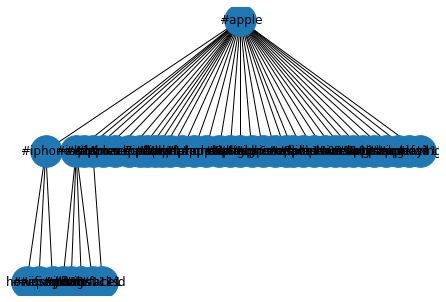

# Approach 2

## Future work: For a particular review, we know the hashtags. We can go ahead and try to classify the new sentences into those hashtags. This would allow us to get the problem areas per hashtag.

### We can do an analysis from the above data - Create word cloud of top hashtags within AmazonHelp.

In [105]:
nodes = dict(sorted(nodes.items(), key=operator.itemgetter(1), reverse=True))

In [106]:
nodes

{'#amazon': 1183,
 '#': 486,
 '#amazonindia': 341,
 '#amazonprime': 323,
 '#prime': 248,
 '#fail': 198,
 '#specialusername': 186,
 '#customerservice': 169,
 '#fraud': 141,
 '#disappointed': 91,
 '#pathetic': 88,
 '#poorservice': 82,
 '#help': 80,
 '#badservice': 73,
 '#delivery': 71,
 '#customerexperience': 69,
 '#amazongreatindianfestival': 65,
 '#cheating': 63,
 '#waste': 62,
 '#order': 60,
 '#worst': 57,
 '#amazonfail': 54,
 '#amazonin': 53,
 '#fake': 53,
 '#india': 50,
 '#service': 48,
 '#ecommerce': 48,
 '#packaging': 46,
 '#nothappy': 46,
 '#amazonuk': 46,
 '#scam': 44,
 '#alexa': 39,
 '#badcustomerservice': 39,
 '#wrong': 36,
 '#refund': 35,
 '#customer': 35,
 '#ups': 35,
 '#blackfriday': 34,
 '#kindle': 33,
 '#useless': 33,
 '#amazonpay': 33,
 '#wtf': 31,
 '#neveragain': 30,
 '#amazonecho': 30,
 '#onlineshopping': 29,
 '#greatindianfestival': 28,
 '#books': 28,
 '#lies': 28,
 '#jeffbezos': 27,
 '#bad': 27,
 '#frustrated': 27,
 '#shame': 26,
 '#epicfail': 26,
 '#poor': 26,
 '#ba

In [107]:
def get_filtered_sentences(s, hashtag):
    final = []
    for i in s:
        if hashtag in i:
            final.append(i)
    return final

In [108]:
sents = get_filtered_sentences(filtered.text_original.tolist(), "#amazonindia")

In [113]:
d = get_word_cloud_dict(sents)

In [110]:
len(sents)

409

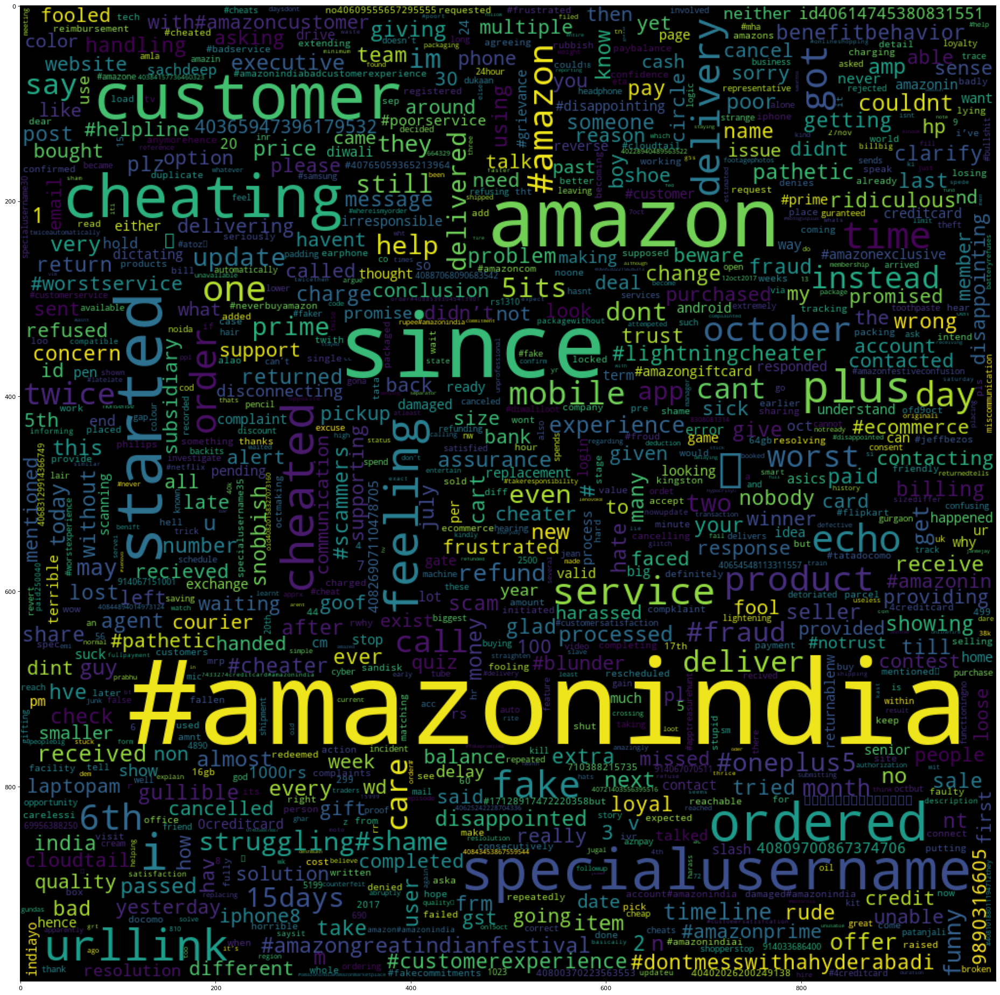

In [114]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(40, 30), dpi=80, facecolor='w', edgecolor='k')
from wordcloud import WordCloud, STOPWORDS 
wc = WordCloud(width=1000,height=1000, max_words=1000,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(d)
plt.imshow(wc)

In [116]:
sents = get_filtered_sentences(filtered.text_original.tolist(), "#amazonprime")

In [117]:
d = get_word_cloud_dict(sents)

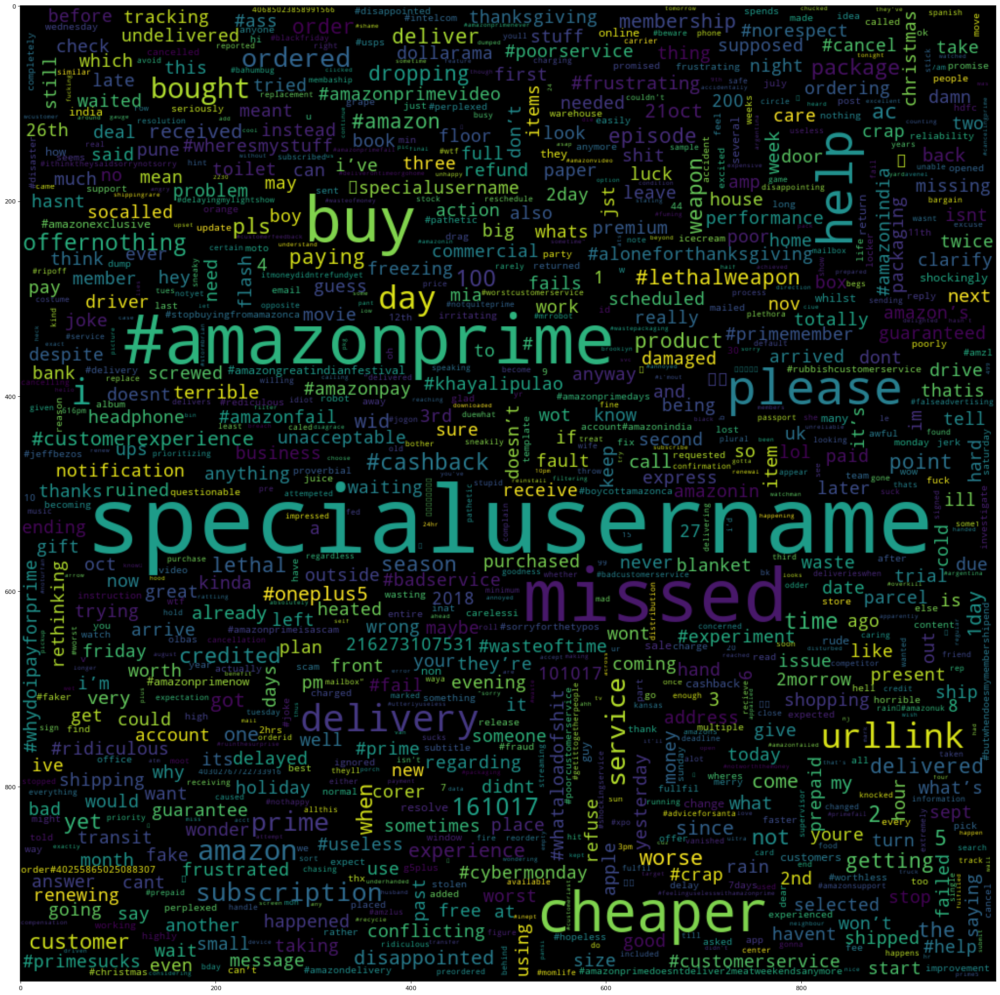

In [118]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(40, 30), dpi=80, facecolor='w', edgecolor='k')
from wordcloud import WordCloud, STOPWORDS 
wc = WordCloud(width=1000,height=1000, max_words=1000,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(d)
plt.imshow(wc)

In [119]:
d

{'specialusername': 1.0,
 'missed': 0.5555555555555556,
 'buy': 0.4067987604282517,
 'cheaper': 0.3181818181818182,
 '#amazonprime': 0.48749196849368653,
 'please': 0.23733923459708822,
 'help': 0.23725137360216272,
 'bought': 0.07324482996380725,
 'subscription': 0.05784054819428815,
 '161017': 0.05263157894736842,
 '100': 0.05,
 '#cashback': 0.047619047619047616,
 'offernothing': 0.045454545454545456,
 'credited': 0.043478260869565216,
 'amazon': 0.07326825488178909,
 'ac': 0.04,
 'pls': 0.03966798571566451,
 'when': 0.040366572109341296,
 'episode': 0.03333333333333333,
 '5': 0.038251078323219355,
 'lethal': 0.03125,
 'weapon': 0.030303030303030304,
 'season': 0.029885453449315303,
 '2': 0.04570796053865689,
 'dropping': 0.027777777777777776,
 '#lethalweapon': 0.02702702702702703,
 'ordered': 0.06455134176195641,
 '#oneplus5': 0.023809523809523808,
 '21oct': 0.023255813953488372,
 'wid': 0.022727272727272728,
 '1day': 0.022244913986887608,
 'delivery': 0.12631969097409418,
 'not': 0

### The top keywords helps a lot in find the key problem areas

## Approach 3: We can also apply semantic clustering using Glove Vectors/ SIF/ InferSent (Facebook Research). Couldn't do that due to lack of time

## Approach 4: We can also look into the response from the company and get more keywords and look at the combined thread which would give us more syntax.

### References

In [ ]:
# https://medium.com/data-from-the-trenches/how-deep-does-your-sentence-embedding-model-need-to-be-cdffa191cb53
# https://towardsdatascience.com/fse-2b1ffa791cf9
# https://medium.com/@dmitriy.kavyazin/principal-component-analysis-and-k-means-clustering-to-visualize-a-high-dimensional-dataset-577b2a7a5fe2

### Some visualization techniques that can be explored

In [ ]:
# https://bl.ocks.org/d3noob/5141528

## Additional Code

### Detecting Language

In [1]:
def lang(s):
    try:
        return detect(s)
    except:
        return None

In [ ]:
df['lang'] = df['text'].apply(lang)

### More cleaning

In [ ]:
from emoticon_list import *
contractions = {
"ain't": "am not",
"aren't": "are not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had",
"he'd've": "he would have",
"he'll": "he shall",
"he'll've": "he shall have",
"he's": "he has",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has",
"i'd": "I had",
"i'd've": "I would have",
"i'll": "I shall",
"i'll've": "I shall have",
"i'm": "I am",
"i've": "I have",
"isn't": "is not",
"it'd": "it had",
"it'd've": "it would have",
"it'll": "it shall",
"it'll've": "it shall have",
"it's": "it has",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had",
"she'd've": "she would have",
"she'll": "she shall",
"she'll've": "she shall have",
"she's": "she has",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as",
"that'd": "that would",
"that'd've": "that would have",
"that's": "that has",
"there'd": "there had",
"there'd've": "there would have",
"there's": "there has",
"they'd": "they had",
"they'd've": "they would have",
"they'll": "they shall",
"they'll've": "they shall have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall",
"what'll've": "what shall have",
"what're": "what are",
"what's": "what has",
"what've": "what have",
"when's": "when has",
"when've": "when have",
"where'd": "where did",
"where's": "where has",
"where've": "where have",
"who'll": "who shall",
"who'll've": "who shall have",
"who's": "who has",
"who've": "who have",
"why's": "why has",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had",
"you'd've": "you would have",
"you'll": "you shall",
"you'll've": "you shall have",
"you're": "you are",
"you've": "you have"
}

In [ ]:
def convert_contractions(text):
    text = text.lower()
    pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in contractions.keys()) + r')(?!\w)')
    result = pattern.sub(lambda x: contractions[x.group()].lower(), text)
#     for emot in EMOTICONS:
#         text = re.sub(u'('+emot+')', "_".join(EMOTICONS[emot].lower().replace(",","").split()), text)
    return result
text = "Hello :-) :-) I'd"
convert_contractions(text)

In [ ]:
def convert_emoticons(text):
#     pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in EMOTICONS.keys()) + r')(?!\w)')
#     result = pattern.sub(lambda x: EMOTICONS[x.group()].lower().replace(",", ""), text)
    for emot in EMOTICONS:
        text = re.sub(u'('+emot+')', "_".join(EMOTICONS[emot].lower().replace(",","").split()), text)
    return text
text = "Hello :-) :-)"
convert_emoticons(text)

In [ ]:
def convert_emojis(text):
    for emot in UNICODE_EMO:
#     pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in UNICODE_EMO.keys()) + r')(?!\w)')
#     result = pattern.sub(lambda x: UNICODE_EMO[x.group()].lower().replace(":", ""), text)
#     return result
        try:
            text = re.sub(r'('+emot+')', "_".join(UNICODE_EMO[emot].lower().replace(",","").replace(":","").split()), text)
        except:
            continue
    return text

text = "game is on 🔥"
convert_emojis(text)

In [ ]:
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(convert_emojis)
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(convert_contractions)
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(convert_emoticons)

In [ ]:
# Got this from github
with open("slang.txt", 'r') as f:
    slangs = f.readlines()
slangs = list(map(lambda x: x.strip("\n"), slangs))
slangs = list(map(lambda x: x.split("="), slangs))
slangs_dict = {}
for i in slangs:
    try:
        slangs_dict[i[0].lower()] = i[1].lower().translate(str.maketrans('', '', string.punctuation))
    except IndexError:
        continue
# slangs_dict = {i[0].lower(): i[1].lower() for i in slangs}

In [ ]:
def convert_abbreviations(text):
    pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in slangs_dict.keys()) + r')(?!\w)')
    result = pattern.sub(lambda x: slangs_dict[x.group()], text)
#     for emot in EMOTICONS:
#         text = re.sub(u'('+emot+')', "_".join(EMOTICONS[emot].lower().replace(",","").split()), text)
    return result
text = "Hello :-) :-) u"
convert_abbreviations(text)

In [ ]:
inbounds_and_outbounds['text_original'] = inbounds_and_outbounds['text_original'].apply(convert_abbreviations)